# AQI- DecisionTree Regression

### Apply ML algorithms

- Linear Regression
- Lasso Regression
- Decision Tree Regressor
- KNN Regressor
- RandomForestRegressor
- Xgboost Regressor
- Huperparameter Tuning
- ANN- Artificial Neural Network

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("AQI_LiveProject\AQI-LiveProject-By-Krish_Naik\AQI-Project-master\Data\Real-Data\Real_Combine.csv")

In [3]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


<AxesSubplot:>

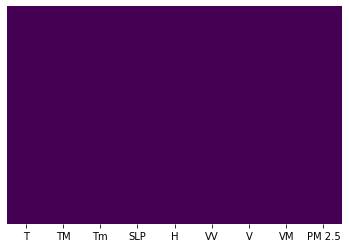

In [4]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [5]:
df=df.dropna()

In [6]:
X=df.iloc[:,:-1] ## independent features
y=df.iloc[:,-1] ## dependent features

In [7]:
## check null values
X.isnull()

,T,TM,Tm,SLP,H,VV,V,VM
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...
1088,False,False,False,False,False,False,False,False
1089,False,False,False,False,False,False,False,False
1090,False,False,False,False,False,False,False,False
1091,False,False,False,False,False,False,False,False


In [8]:
y.isnull()

0       False
1       False
2       False
3       False
4       False
        ...  
1088    False
1089    False
1090    False
1091    False
1092    False
Name: PM 2.5, Length: 1092, dtype: bool

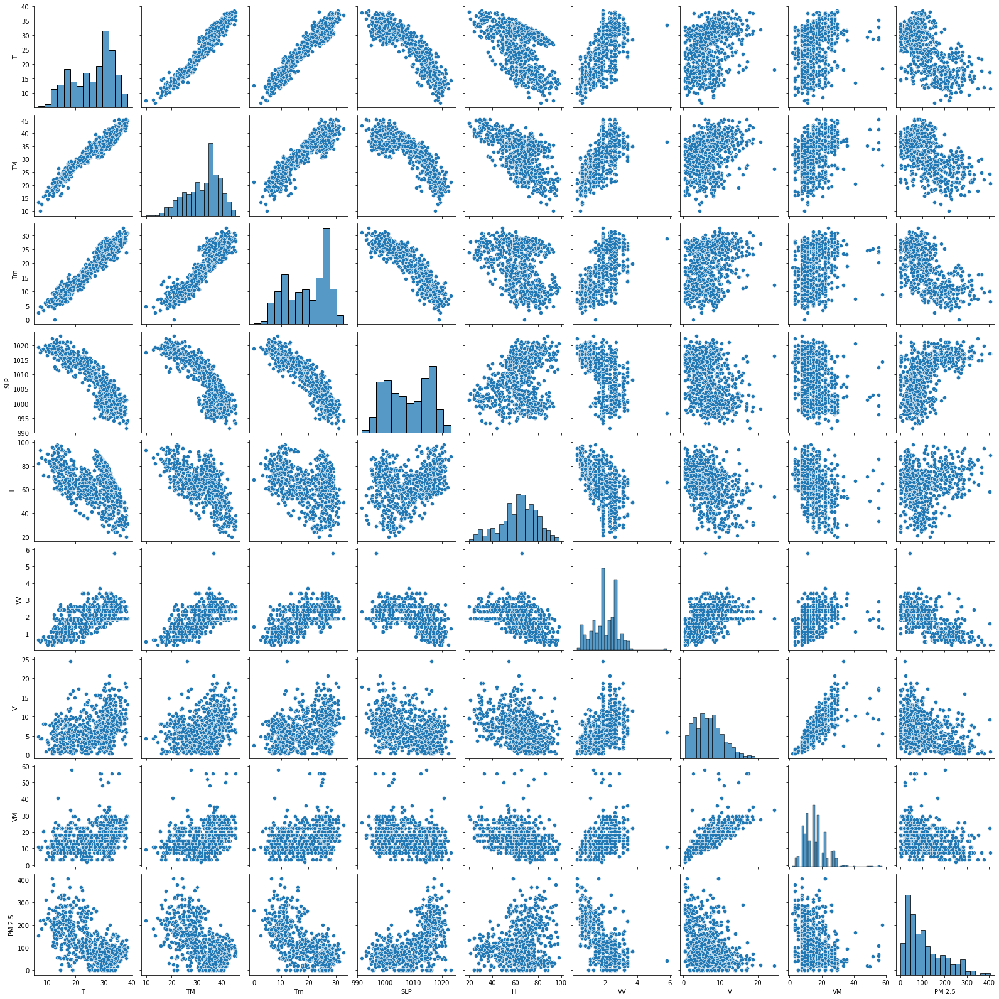

In [9]:
sns.pairplot(df)

In [10]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967536,0.953719,-0.881409,-0.509299,0.640792,0.301994,0.287738,-0.631462
TM,0.967536,1.000000,0.892031,-0.822958,-0.586681,0.606945,0.292949,0.297011,-0.568409
Tm,0.953719,0.892031,1.000000,-0.917518,-0.287357,0.577240,0.296225,0.266782,-0.673824
SLP,-0.881409,-0.822958,-0.917518,1.000000,0.240256,-0.517915,-0.329838,-0.310704,0.623187
H,-0.509299,-0.586681,-0.287357,0.240256,1.000000,-0.465374,-0.380575,-0.362177,0.138005
VV,0.640792,0.606945,0.577240,-0.517915,-0.465374,1.000000,0.376873,0.342442,-0.573941
V,0.301994,0.292949,0.296225,-0.329838,-0.380575,0.376873,1.000000,0.775655,-0.268530
VM,0.287738,0.297011,0.266782,-0.310704,-0.362177,0.342442,0.775655,1.000000,-0.215854
PM 2.5,-0.631462,-0.568409,-0.673824,0.623187,0.138005,-0.573941,-0.268530,-0.215854,1.000000


## Correlation Matrix with Heatmap
-Correlation states how the features are related to each other or the target variable.

-Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable)

-Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.

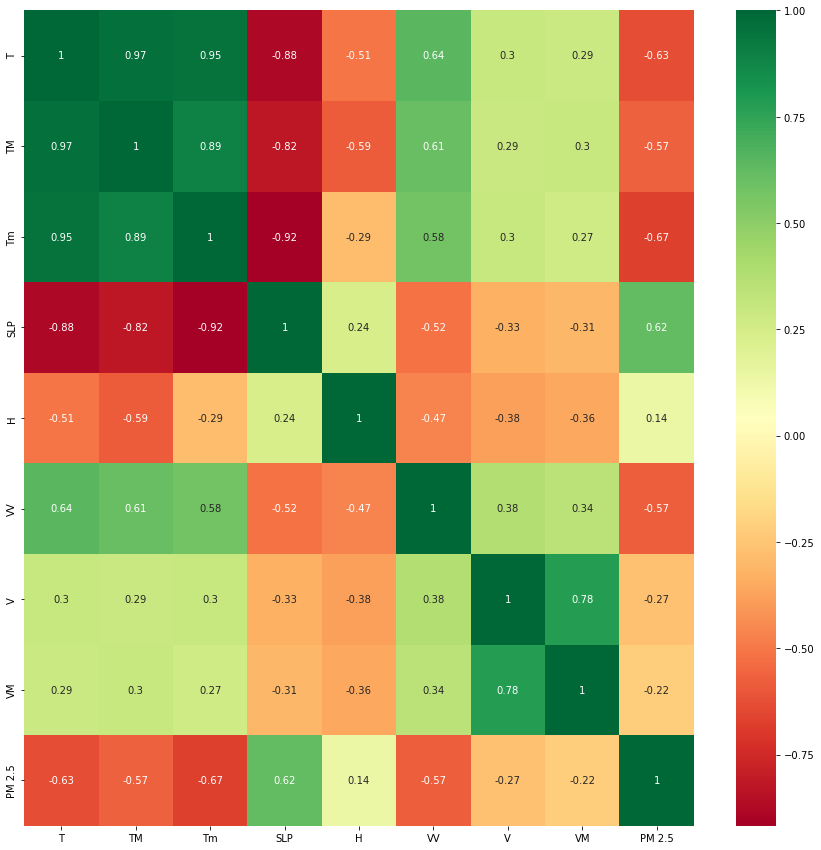

In [11]:
import seaborn as sns
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(15,15))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

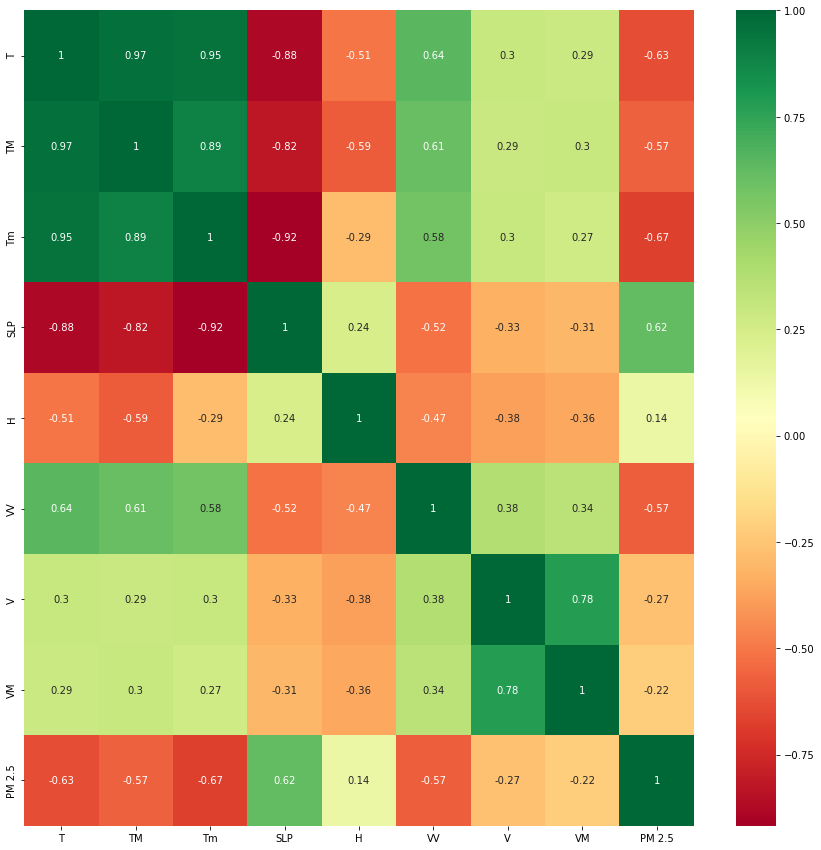

In [12]:
plt.figure(figsize=(15,15))
g=sns.heatmap(df.corr(), annot=True,cmap="RdYlGn")

In [13]:
corrmat.index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

In [14]:
df.corr().index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

### Feature Importance
- you can get the feature importance of each feature of your dataset by using the feature importance property of the model.
- Feature importance gives you a score for each feature of your data, the higher the score more important or relavant is the feature towards your output variable.
- Feature importance is an inbuilt class that comes with Tree based Regression.we will be using Extra Regressior for extracting the Top10 Features for the data set.

In [15]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model=ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor()

In [16]:
print(model.feature_importances_)

[0.15680849 0.10708813 0.21912129 0.15019732 0.08641915 0.1865364
 0.05347006 0.04035916]


In [17]:
df.corr().index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

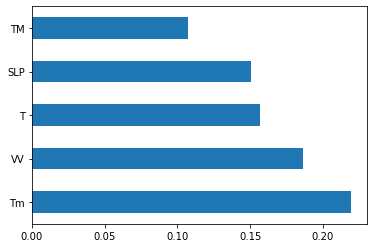

In [18]:
# plot graph of feature importances for better visualization
feature_importances= pd.Series(model.feature_importances_, index=X.columns)
feature_importances.nlargest(5).plot(kind='barh')
plt.show()

## Decision Regression

C:\Users\abdul\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

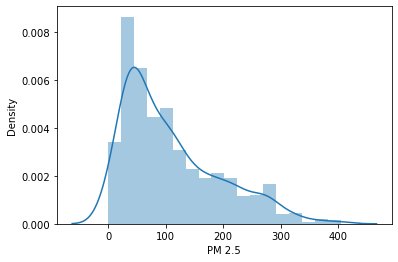

In [19]:
sns.distplot(y)

## Train Test Split

In [20]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test =train_test_split(X,y, test_size=0.3, random_state=0)

In [21]:
from sklearn.tree import DecisionTreeRegressor

In [22]:
dtree= DecisionTreeRegressor(criterion='mse')
dtree.fit(X_train, y_train)

DecisionTreeRegressor()

In [23]:
X_train

,T,TM,Tm,SLP,H,VV,V,VM
1068,21.7,30.0,12.2,1014.5,52.0,1.1,6.3,16.5
181,13.6,20.4,7.5,1020.7,67.0,1.1,10.2,40.7
426,31.8,39.6,25.4,1005.6,35.0,1.9,11.1,27.8
1019,28.3,35.8,26.8,1003.9,89.0,1.6,4.3,11.1
9,11.9,18.9,6.3,1020.1,76.0,1.1,8.3,20.6
...,...,...,...,...,...,...,...,...
1034,30.8,35.2,26.8,1005.0,76.0,2.7,3.7,18.3
764,26.8,33.4,15.7,1014.5,52.0,2.4,4.6,9.4
836,31.9,35.0,28.3,1001.3,72.0,2.1,2.8,9.4
560,11.9,15.7,7.5,1018.9,86.0,0.8,6.1,11.1


In [24]:
X_test

,T,TM,Tm,SLP,H,VV,V,VM
785,33.1,39.0,24.0,1003.0,26.0,2.6,10.4,24.1
742,12.0,17.0,6.7,1019.8,75.0,1.3,7.6,13.0
748,15.2,22.6,6.6,1018.2,56.0,1.9,8.9,22.2
986,32.9,39.0,27.4,996.6,50.0,2.4,9.4,27.8
480,29.4,34.4,26.4,999.9,86.0,1.8,2.2,14.8
...,...,...,...,...,...,...,...,...
492,32.1,36.6,28.0,1000.8,56.0,1.9,15.4,25.9
62,29.9,38.8,21.7,1000.8,29.0,1.9,12.0,24.1
79,34.1,40.3,28.8,999.7,59.0,1.9,10.9,16.5
300,30.5,36.2,25.4,997.3,65.0,2.3,18.5,29.4


In [25]:
y_train

1068    235.333333
181     166.916667
426      80.208333
1019     57.583333
9       107.625000
           ...    
1034     30.666667
764       1.791667
836      38.250000
560     107.625000
685      48.916667
Name: PM 2.5, Length: 764, dtype: float64

In [26]:
y_test

785    104.625000
742    125.891667
748    279.600000
986    110.416667
480     31.333333
          ...    
492     44.125000
62     142.500000
79      65.166667
300     22.333333
194      0.000000
Name: PM 2.5, Length: 328, dtype: float64

In [27]:
print("Coefficient of determination R^2 <---on train set:{} ".format(dtree.score(X_train,y_train)))

Coefficient of determination R^2 <---on train set:1.0 


In [28]:
print("Coefficient of determination R^2 <---on test set:{} ".format(dtree.score(X_test,y_test)))

Coefficient of determination R^2 <---on test set:0.6663264860158907 


## Cross_val_score

In [29]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(dtree, X,y,cv=5)  # Evaluate a score by cross-validation

In [30]:
score.mean() # this is the R^2 value. which is the accuracy measurement.

0.5309702214010701

## Tree Visualization

- Scikitlearn actually has some built-in visualization capabilities for decision trees, you dont use it often and it requires you to install the pydot library. but here is an example of what it looks like and the code to execute this.

In [31]:
import six
import sys
sys.modules['sklearn.externals.six'] = six

In [32]:
from six import StringIO

In [34]:
### conda install pydotplus
### conda install python-graphviz

from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [35]:
features=list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [36]:
import os 
os.environ["PATH"]= os.environ["PATH"]+";"+os.environ["CONDA_PREFIX"]+r"\Library\bin\graphviz"

In [37]:
dot_data= StringIO()
export_graphviz(dtree, out_file=dot_data, feature_names=features, filled=True, rounded=True)

graph= pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.954221 to fit



C:\Users\abdul\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

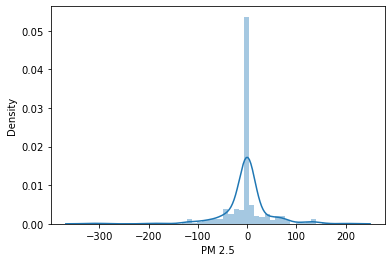

In [38]:
prediction= dtree.predict(X_test)
sns.distplot(y_test-prediction)

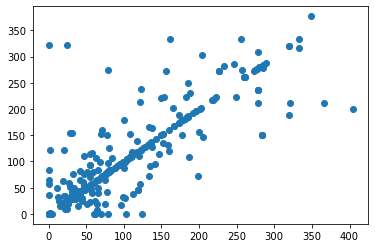

In [39]:
plt.scatter(y_test, prediction)

## Hyperparametric Tuning Decision Tree Regression

In [40]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [41]:
# Hyper parameter optimization
params={
    "splitter":['best',"random"],
    "max_depth":[3,4,5,6,8,10,12,15],
    "min_samples_leaf":[1,2,3,4,5],
    "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
    "max_features":["auto", "log2", "sqrt", None],
     "max_leaf_nodes":[None,10,20,30,40,50,60,70],
}

In [42]:
# Hyperparameter optimization using GridsearchCV
from sklearn.model_selection import GridSearchCV

In [43]:
random_search=GridSearchCV(dtree, param_grid=params, scoring="neg_mean_squared_error", n_jobs=-1,cv=10, verbose=3)

In [53]:
def timer(start_time=None):
    if not start_time:
        start_time= datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec= divmod((datetime.now()-start_time).total_seconds(),3600)
        tmin,tsec=divmod(temp_sec,60)
        print("\n Time taken: %i hours %i minutes and %s seconds." %(thour, tmin, round(tsec,2)))

In [54]:
from datetime import datetime
# here we go 
start_time=timer(None) # Timing start from this point for "start_time " variable
random_search.fit(X,y)
timer(start_time) # timing ends here for the "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits

 Time taken: 0 hours 2 minutes and 6.92 seconds.


In [55]:
random_search.best_params_

{'max_depth': 5,
 'max_features': 'auto',
 'max_leaf_nodes': 10,
 'min_samples_leaf': 1,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [56]:
random_search.best_score_

-3131.6489619178874

C:\Users\abdul\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

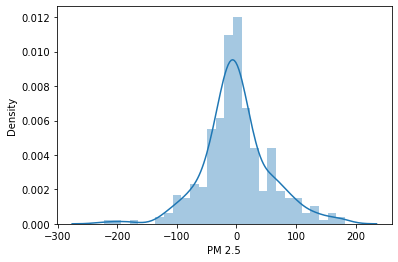

In [57]:
prediction= random_search.predict(X_test)
sns.distplot(y_test-prediction)

In [58]:
from sklearn import metrics

In [59]:
print("MAE:", metrics.mean_absolute_error(y_test, prediction))
print("MSE:", metrics.mean_squared_error(y_test, prediction))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 40.141630924739424
MSE: 3171.8081459801983
RMSE: 56.31880810155874


In [60]:
import pickle

In [61]:
# open a file where you want to store the data
file= open("decision_regression_model.pkl", "wb")

# dump information to that file
pickle.dump(random_search, file)